In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import time
import datetime
import math
%matplotlib inline

In [12]:
df = pd.read_csv('analyze_me.csv')

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5983 entries, 0 to 5982
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   delivery_id                          5983 non-null   int64  
 1   customer_id                          5983 non-null   int64  
 2   jumpman_id                           5983 non-null   int64  
 3   vehicle_type                         5983 non-null   object 
 4   pickup_place                         5983 non-null   object 
 5   place_category                       5100 non-null   object 
 6   item_name                            4753 non-null   object 
 7   item_quantity                        4753 non-null   float64
 8   item_category_name                   4753 non-null   object 
 9   how_long_it_took_to_order            3038 non-null   object 
 10  pickup_lat                           5983 non-null   float64
 11  pickup_lon                    

In [14]:
df.how_long_it_took_to_order = pd.to_timedelta(df.how_long_it_took_to_order)
df.when_the_delivery_started = pd.to_datetime(df.when_the_delivery_started)
df.when_the_Jumpman_arrived_at_dropoff = pd.to_datetime(df.when_the_Jumpman_arrived_at_dropoff)
df.when_the_Jumpman_arrived_at_pickup = pd.to_datetime(df.when_the_Jumpman_arrived_at_pickup)
df.when_the_Jumpman_left_pickup = pd.to_datetime(df.when_the_Jumpman_left_pickup)

In [15]:
for column in df[['when_the_delivery_started','when_the_Jumpman_arrived_at_pickup','when_the_Jumpman_left_pickup','when_the_Jumpman_arrived_at_dropoff']].dropna():
    df[column] = df[column].apply(pd.to_datetime)

for column in df[['when_the_delivery_started','when_the_Jumpman_arrived_at_pickup','when_the_Jumpman_left_pickup','when_the_Jumpman_arrived_at_dropoff']]:
    print(df[column].dtype)

datetime64[ns]
datetime64[ns]
datetime64[ns]
datetime64[ns]


I am converting the columns: when_the_delivery_started, when_the_Jumpman_arrived_at_pickup, when_the_Jumpman_left_pick and when_the_Jumpman arrived_at dropoff from objects to datetime.

I am also converting the column how_long_it_took_to_order into a time delta.

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5983 entries, 0 to 5982
Data columns (total 18 columns):
 #   Column                               Non-Null Count  Dtype          
---  ------                               --------------  -----          
 0   delivery_id                          5983 non-null   int64          
 1   customer_id                          5983 non-null   int64          
 2   jumpman_id                           5983 non-null   int64          
 3   vehicle_type                         5983 non-null   object         
 4   pickup_place                         5983 non-null   object         
 5   place_category                       5100 non-null   object         
 6   item_name                            4753 non-null   object         
 7   item_quantity                        4753 non-null   float64        
 8   item_category_name                   4753 non-null   object         
 9   how_long_it_took_to_order            3038 non-null   timedelta64[ns]
 10  

In [17]:
print(df[(df.pickup_lat > 42) | (df.pickup_lat < 40)].shape)
print(df[(df.pickup_lon < -75) | (df.pickup_lon > -72)].shape)
print(df[(df.dropoff_lat > 42) | (df.dropoff_lat < 40)].shape)
print(df[(df.dropoff_lon < -75) | (df.dropoff_lon > -72)].shape)

(0, 18)
(0, 18)
(0, 18)
(0, 18)


In [18]:
date_columns = ['when_the_delivery_started','when_the_Jumpman_arrived_at_pickup',
                'when_the_Jumpman_left_pickup','when_the_Jumpman_arrived_at_dropoff']

In [19]:
for i in range(len(date_columns)):
    cola = date_columns[i]
    for j in range(i+1, len(date_columns)):
        colb = date_columns[j]
        sze = df[df[cola] > df[colb]].shape[0]
        print("# of rows {0} > {1}: {2}".format(cola, colb, sze))

# of rows when_the_delivery_started > when_the_Jumpman_arrived_at_pickup: 501
# of rows when_the_delivery_started > when_the_Jumpman_left_pickup: 2
# of rows when_the_delivery_started > when_the_Jumpman_arrived_at_dropoff: 0
# of rows when_the_Jumpman_arrived_at_pickup > when_the_Jumpman_left_pickup: 0
# of rows when_the_Jumpman_arrived_at_pickup > when_the_Jumpman_arrived_at_dropoff: 0
# of rows when_the_Jumpman_left_pickup > when_the_Jumpman_arrived_at_dropoff: 0


Based on this, we have 501 rows of data that are missing corresponding times for when_the_Jumpman_arrived_at_pickup and 2 rows that are missing corresponding times from when_the_delivery_started to when_the_Jumpman_left.

My suggestion is to look into the process or data type that is being logged for these events. I'm also not certain if Jumpman manually have to select that they have picked up an order.

In [20]:
bad_data = df[(df.when_the_delivery_started > df.when_the_Jumpman_arrived_at_pickup) | (df.when_the_delivery_started > df.when_the_Jumpman_left_pickup)]

In [21]:
analysis_df = df[~df.index.isin(bad_data.index)].copy()

In [22]:
analysis_df['delivery_day'] = analysis_df.when_the_delivery_started.dt.day
analysis_df['delivery_hour'] = analysis_df.when_the_delivery_started.dt.hour
analysis_df['delivery_dayofweek'] = analysis_df.when_the_delivery_started.dt.dayofweek
analysis_df['delivery_week'] = analysis_df.when_the_delivery_started.dt.week

In [24]:
delivery_df = analysis_df[['delivery_id','delivery_hour','delivery_day',
                           'delivery_dayofweek','delivery_week','dropoff_lat',
                           'dropoff_lon','pickup_lat','pickup_lon']].drop_duplicates()

In [25]:
print("Average orders per day: {:3.2f}".format(delivery_df.groupby('delivery_day')['delivery_id'].count().mean()))
print("Average orders per week: {:3.2f}".format(delivery_df.groupby('delivery_week')['delivery_id'].count().mean()))

Average orders per day: 159.20
Average orders per week: 955.20


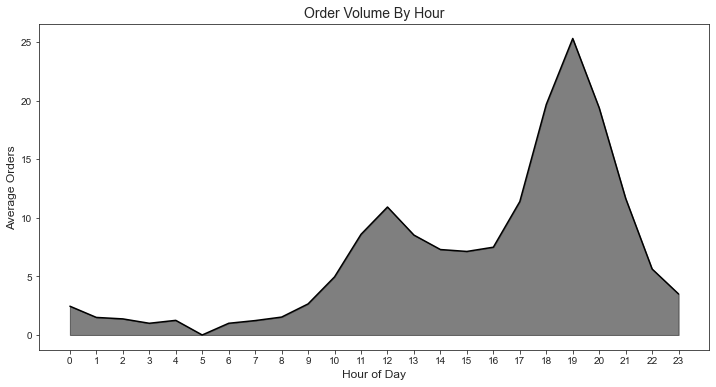

In [26]:
hourly_orders = delivery_df.groupby(['delivery_day','delivery_hour'])['delivery_id'].count().groupby('delivery_hour').mean()
for hr in range(24):
    if hr not in hourly_orders:
        hourly_orders[hr] = 0
hourly_orders = hourly_orders.sort_index()
plt.figure(figsize=(12,6))
sns.set_style("ticks")
sns.lineplot(x = hourly_orders.index, y=hourly_orders.values, color="black")
plt.fill_between(x=range(24),y1 = 0, y2=hourly_orders.values, color="k",alpha=0.5)
plt.title('Order Volume By Hour',fontsize=14)
plt.xticks(range(24))
plt.xlabel('Hour of Day',fontsize=12)
plt.ylabel('Average Orders',fontsize=12);

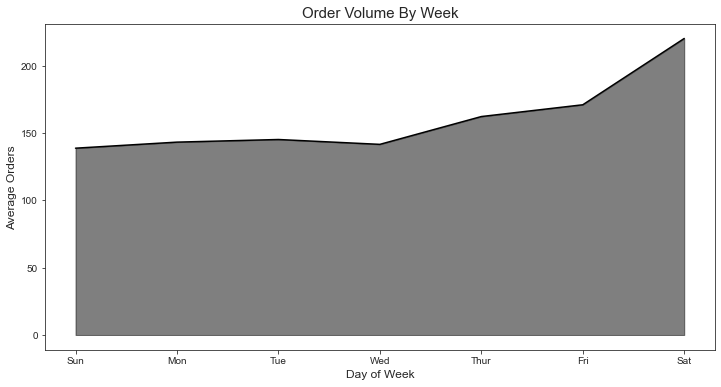

In [27]:
weekly_orders = delivery_df.groupby(['delivery_week','delivery_dayofweek'])['delivery_id'].count().groupby('delivery_dayofweek').mean()
for dy in range(7):
    if dy not in weekly_orders:
        weekly_orders[dy] = 0
weekly_orders = weekly_orders.sort_index()
plt.figure(figsize=(12,6))
sns.set_style("ticks")
sns.lineplot(x = weekly_orders.index, y=weekly_orders.values, color="black")
plt.fill_between(x=range(7),y1 = 0, y2=weekly_orders.values, color="k",alpha=0.5)
plt.title('Order Volume By Week',fontsize=15)
plt.xticks(ticks=range(7),labels=['Sun','Mon','Tue','Wed','Thur','Fri','Sat'])
plt.xlabel('Day of Week',fontsize=12)
plt.ylabel('Average Orders',fontsize=12);

Based on the visualization,we are seeing here is that average number of orders peak around 7:00 PM and the average number of weekly orders start to increase on Thursday in October then peak on Saturday.

In [28]:
count_customer_id = df.groupby('customer_id').count()
count_customer_id.head(10)

,delivery_id,jumpman_id,vehicle_type,pickup_place,place_category,item_name,item_quantity,item_category_name,how_long_it_took_to_order,pickup_lat,pickup_lon,dropoff_lat,dropoff_lon,when_the_delivery_started,when_the_Jumpman_arrived_at_pickup,when_the_Jumpman_left_pickup,when_the_Jumpman_arrived_at_dropoff
customer_id,,,,,,,,,,,,,,,,,
242,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
641,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1
1311,2,2,2,2,2,2,2,2,1,2,2,2,2,2,2,2,2
1517,1,1,1,1,0,0,0,0,1,1,1,1,1,1,0,0,1
2533,2,2,2,2,2,2,2,2,0,2,2,2,2,2,0,0,2
3253,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1
4305,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
5056,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1
5139,2,2,2,2,1,2,2,2,1,2,2,2,2,2,1,1,2


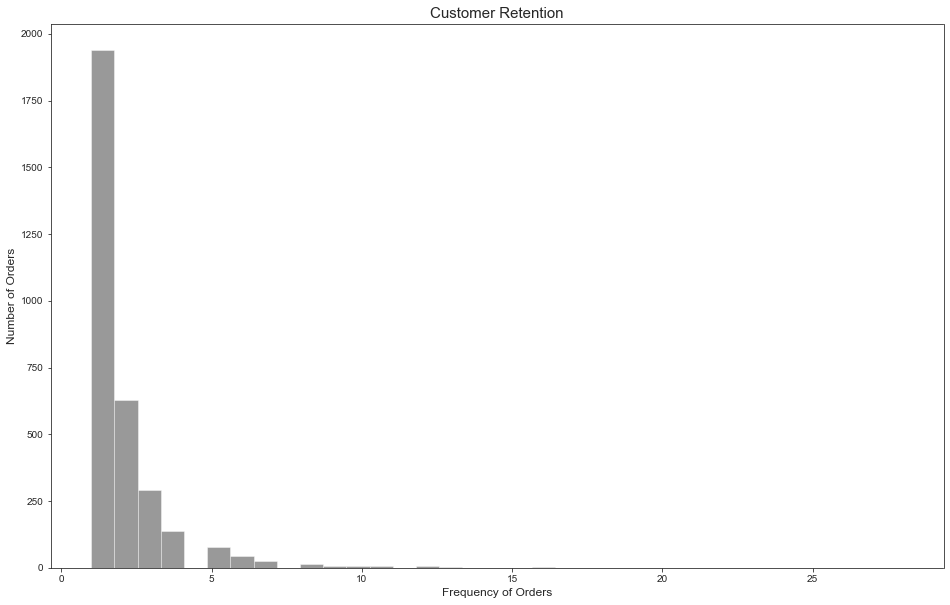

In [29]:
fig = plt.gcf()
fig.set_size_inches( 16,10)
sns.distplot(count_customer_id['delivery_id'],bins=35,kde=False,color='black')
plt.title('Customer Retention',fontsize=15)
plt.xlabel('Frequency of Orders',fontsize=12)
plt.ylabel('Number of Orders',fontsize=12);


Based on the number visual, the majority of orders are coming from first time users. A small portion of customers have ordered at least five times or more in October.

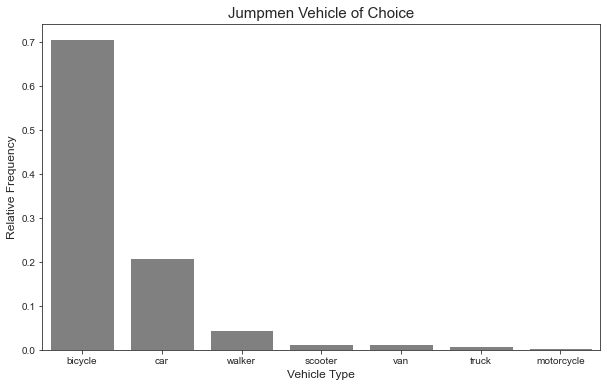

In [30]:
plt.figure(figsize=(10,6))
vehicle_df = analysis_df.vehicle_type.value_counts(normalize=True)
sns.set_style("ticks")
sns.barplot(x=vehicle_df.index, y=vehicle_df.values, color="grey")
plt.title('Jumpmen Vehicle of Choice',fontsize=15)
plt.xlabel('Vehicle Type',fontsize=12)
plt.ylabel('Relative Frequency',fontsize=12);

In [31]:
def totalTime(x):
    return(x.total_seconds()/60)

df['time_to_deliver'] = df['when_the_Jumpman_arrived_at_dropoff'] - df['when_the_delivery_started']
df['time_to_deliver'] = df['time_to_deliver'].apply(totalTime)


In [32]:
df['time_to_deliver'].describe()

count    5983.000000
mean       46.081178
std        20.226641
min         3.047181
25%        32.667249
50%        42.674769
75%        55.126968
max       340.308810
Name: time_to_deliver, dtype: float64

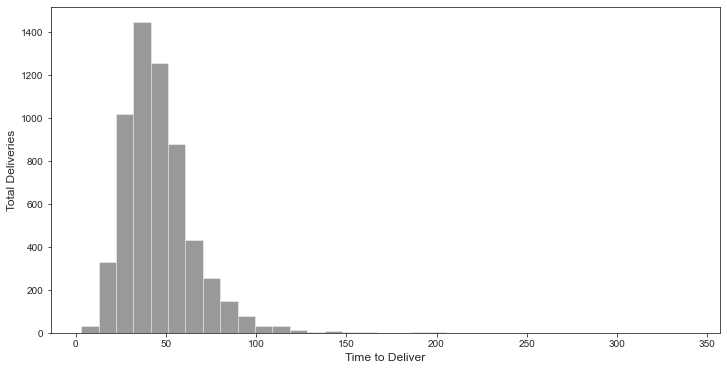

In [33]:
plt.figure(figsize=(12,6))
sns.set_style("ticks")
sns.distplot(df['time_to_deliver'],bins=35,kde=False,color='black')
plt.xlabel('Time to Deliver',fontsize=12)
plt.ylabel('Total Deliveries',fontsize=12);

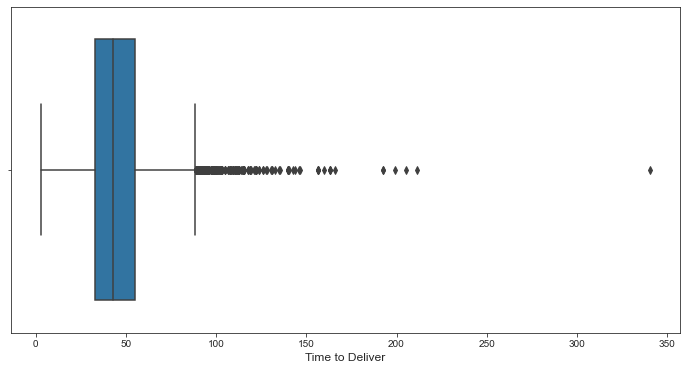

In [53]:
plt.figure(figsize=(12,6))
ax = sns.boxplot(x='time_to_deliver', data=df[['time_to_deliver']])
plt.xlabel('Time to Deliver',fontsize=12);

Based on the descriptive and visual for time_to_deliver, the average time to deliver an order is 46 minutes.

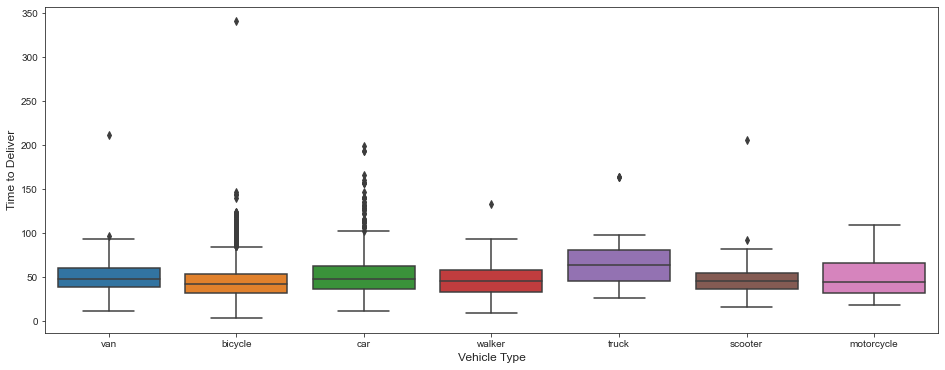

In [34]:
plt.figure(figsize=(16,6))
sns.set_style("ticks")
ax = sns.boxplot(x='vehicle_type', y='time_to_deliver', data=df[['vehicle_type','time_to_deliver']])
plt.xlabel('Vehicle Type',fontsize=12)
plt.ylabel('Time to Deliver',fontsize=12);

According to the boxplots, Scooters and Bicycles have the shortest time to deliver.  

Test of Folium

In [35]:
import folium
map1 = folium.Map(location=[40.7261, -73.9727], zoom_start=11.5, tiles='cartodbpositron')
map1

In [36]:
pickups = df[['pickup_lat', 'pickup_lon']]
locationlist = pickups.values.tolist()
len(locationlist)
locationlist[7]

[40.7297909, -74.00058929999999]

In [37]:
from folium.plugins import MarkerCluster

Visual representation of the number of pickups by area. You are able to zoom in on the map to drill down further.

In [38]:
map2 = folium.Map(location=[40.7261, -73.9727], tiles='CartoDB dark_matter', zoom_start=11)

marker_cluster = MarkerCluster().add_to(map2)

for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point], popup=df['delivery_id'][point]).add_to(marker_cluster)
map2

In [ ]:
What it shows is that there is a large concentrations of orders that begin in Lower Manhattan, Midtown and around Central Park.

In [40]:
dropoffs = df[['dropoff_lat', 'dropoff_lon']]
droplocationlist = dropoffs.values.tolist()
len(droplocationlist)
droplocationlist[7]

[40.7347026, -73.9982061]

Visual representation of the number of dropoffs by area. You are able to zoom in on the map to drill down further.

In [41]:
map3 = folium.Map(location=[40.7261, -73.9727], tiles='CartoDB dark_matter', zoom_start=11)

marker_cluster = MarkerCluster().add_to(map3)

for point in range(0, len(droplocationlist)):
    folium.Marker(droplocationlist[point], popup=df['delivery_id'][point]).add_to(marker_cluster)
map3